In [2]:
import torch
import gc

def clear_hardwares():
    torch.clear_autocast_cache()
    torch.cuda.ipc_collect()
    torch.cuda.empty_cache()
    gc.collect()

clear_hardwares()
clear_hardwares()

In [3]:
from diffusers import DDPMScheduler, UNet2DModel, StableDiffusion3Pipeline
from diffusers.models.unets.unet_2d import UNet2DOutput
model_id = "google/ddpm-cat-256"
scheduler: DDPMScheduler = DDPMScheduler.from_pretrained(model_id)
unet: UNet2DModel = UNet2DModel.from_pretrained(model_id, device_map="cuda").eval()
print(unet.sample_size)

def unet_infer(noise: torch.Tensor)->UNet2DOutput:
    with torch.no_grad():
        output: UNet2DOutput = unet(noise.to("cuda"),999)
        output.sample = output.sample.to("cpu")
        # del output.sample
        # output.sample = sample
        torch.cuda.empty_cache()
        return output
unet

256


UNet2DModel(
  (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=128, out_features=512, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=512, out_features=512, bias=True)
  )
  (down_blocks): ModuleList(
    (0-1): 2 x DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
          (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=512, out_features=128, bias=True)
          (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Con

In [10]:
unet(torch.randn([1,3,64,64],device="cuda"), 5)

UNet2DOutput(sample=tensor([[[[ 2.2037,  1.7991,  0.6983,  ...,  2.5432, -0.3901, -1.3874],
          [-3.1354, -0.8321, -2.4594,  ..., -0.7190,  2.9552, -2.1304],
          [ 2.3184,  3.1199, -0.5421,  ..., -0.7916, -0.7497,  1.4916],
          ...,
          [ 0.1722, -2.8764, -0.8926,  ..., -0.5692,  0.7604, -2.0219],
          [-1.1291,  1.5261,  2.4389,  ...,  0.9201, -0.8208, -0.3926],
          [-0.3949, -2.0810, -0.3721,  ...,  0.2193,  0.9078,  1.3066]],

         [[-0.0584, -0.9734,  1.7369,  ..., -0.2015, -0.9573,  1.8260],
          [ 0.8521, -0.2453,  0.3977,  ..., -0.7406, -0.1375, -0.3095],
          [-0.7737, -0.2791,  1.3606,  ...,  0.0196,  1.6270, -1.3190],
          ...,
          [ 0.2480,  2.4576, -0.7250,  ...,  1.3611,  1.4548,  0.6686],
          [-1.2131, -2.3343,  1.7204,  ..., -2.8780, -2.4294,  0.4213],
          [ 4.0466, -0.9815,  3.2508,  ...,  2.4977,  0.1113, -1.7814]],

         [[-1.5683, -0.4345, -2.3457,  ..., -1.8059,  0.2637, -0.3492],
          

In [3]:
noise_sample = torch.randn((1,3,unet.sample_size, unet.sample_size))
for i in range(10):
    output_sample: UNet2DOutput = unet_infer(noise_sample)
    print(output_sample.sample.shape)

torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])
torch.Size([1, 3, 256, 256])


In [4]:
import matplotlib.pyplot as plt
from math import ceil
from tqdm import tqdm
import numpy as np
from PIL.Image import Image
def show_images(images: list[Image]| np.ndarray, img_per_row = 5):
    n_rows = ceil(len(images) / img_per_row)
    fig, axes = plt.subplots(n_rows, img_per_row, figsize=(img_per_row * 4, n_rows * 4))
    axes = axes.flatten()
    steps = scheduler.timesteps.tolist()
    steps.insert(0, scheduler.config.num_train_timesteps)

    assert len(images) == len(steps)

    for i, (s, img) in enumerate(zip(steps, images)):
        ax = axes[i]
        ax.imshow(img)
        ax.set_title(f"Step: {s}")
        ax.axis("off")  # Hide axes ticks and labels
    for j in range(len(images), len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

##  **Inference**

In [5]:
scheduler.set_timesteps(20)
print(scheduler.timesteps)
print(scheduler.config.prediction_type)

tensor([950, 900, 850, 800, 750, 700, 650, 600, 550, 500, 450, 400, 350, 300,
        250, 200, 150, 100,  50,   0])
epsilon


Steps: 20/20 [██████████]  4.84it/s


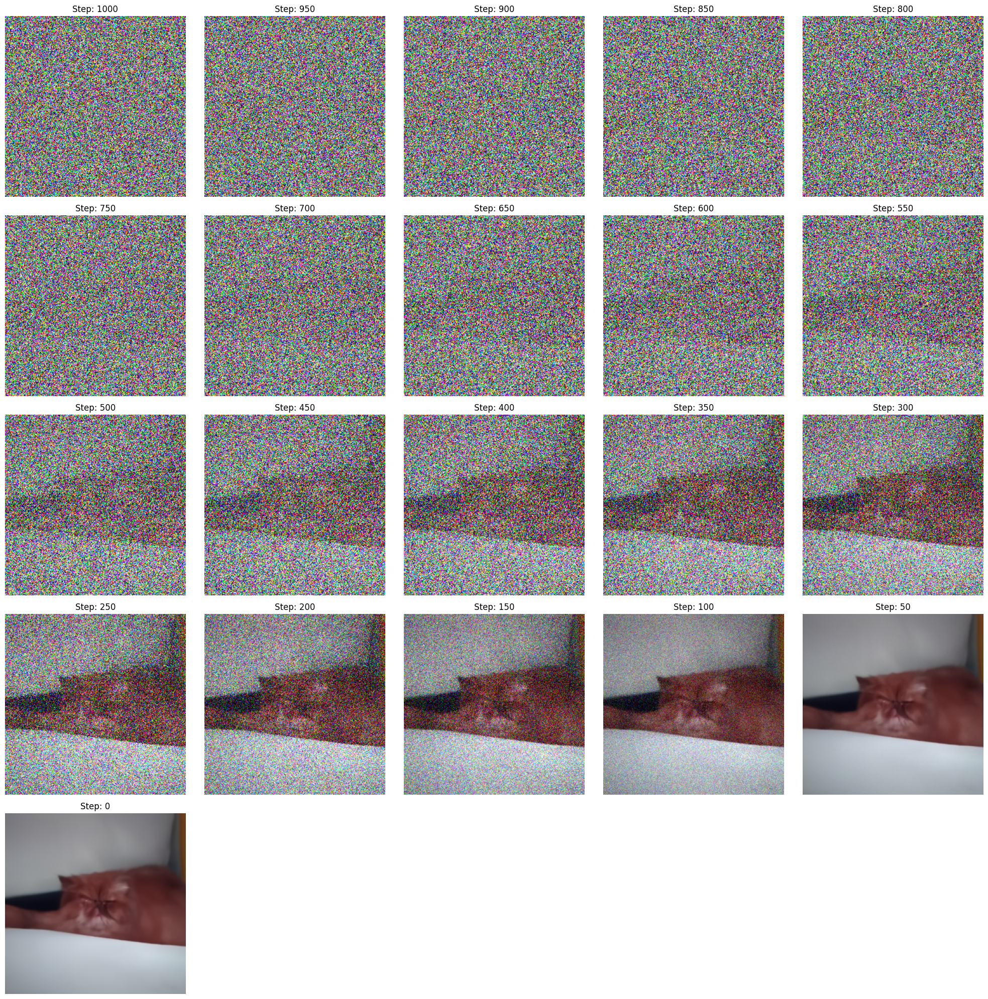

In [6]:
all_z:torch.Tensor = noise_sample

for t in tqdm(scheduler.timesteps, bar_format="Steps: {n_fmt}/{total_fmt} [{bar}] {rate_fmt}"):
    with torch.inference_mode():
        noisy_residual = unet(input_sample:=all_z[-1].unsqueeze(0).to("cuda"), t ).sample

    # Scheduler.step return output of Unet as epsilon (predict noise) and return the previous sample z_t_1.
    z_t_1 = scheduler.step(noisy_residual,t ,input_sample).prev_sample
    all_z = torch.cat([all_z,z_t_1.to("cpu")])
    torch.cuda.empty_cache()

# This is the standard post process, appear in all pipeline post processor (StableDiffusion3Pipeline, DDPMPipeline,...)
# You can convert further to PIL with unit for saving memory.
images = (all_z/2 +0.5).clamp(0,1).permute(0,2,3,1).numpy()
show_images(images)

In [13]:
all_z[0].min()

tensor(-4.2088)